In [4]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/medical-scan-classification-dataset/Pneumonia/Pneumonia/X-Ray/Bacterial/Pneumonia-Bacterial (859).jpg
/kaggle/input/medical-scan-classification-dataset/Pneumonia/Pneumonia/X-Ray/Bacterial/BACTERIA-5132924-0001.jpeg
/kaggle/input/medical-scan-classification-dataset/Pneumonia/Pneumonia/X-Ray/Bacterial/BACTERIA-1777631-0001.jpeg
/kaggle/input/medical-scan-classification-dataset/Pneumonia/Pneumonia/X-Ray/Bacterial/Pneumonia-Bacterial (1013).jpg
/kaggle/input/medical-scan-classification-dataset/Pneumonia/Pneumonia/X-Ray/Bacterial/Pneumonia-Bacterial (283).jpg
/kaggle/input/medical-scan-classification-dataset/Pneumonia/Pneumonia/X-Ray/Bacterial/BACTERIA-7392124-0001.jpeg
/kaggle/input/medical-scan-classification-dataset/Pneumonia/Pneumonia/X-Ray/Bacterial/person1432_bacteria_3699 (2).jpeg
/kaggle/input/medical-scan-classification-dataset/Pneumonia/Pneumonia/X-Ray/Bacterial/BACTERIA-9072988-0007.jpeg
/kaggle/input/medical-scan-classification-dataset/Pneumonia/Pneumonia/X-Ray/Bac

In [5]:
# import system libs
import os
import time
import shutil
import pathlib
import itertools
from PIL import Image

# import data handling tools
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

# import Deep learning Libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras import regularizers

# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

print ('modules loaded')

2025-09-30 10:04:32.056273: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1759226672.080426     623 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1759226672.088252     623 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


modules loaded


In [6]:
# Generate data paths with labels
data_dir = '/kaggle/input/medical-scan-classification-dataset/Alzheimer/Alzheimer/MRI'

filepaths = []
labels = []

folds = os.listdir(data_dir) 
for fold in folds:
    foldpath = os.path.join(data_dir, fold) 
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        filepaths.append(fpath)
        labels.append(fold)
        
# Concatenate data paths with labels into one dataframe
Fseries = pd.Series(filepaths, name= 'filepaths')
Lseries = pd.Series(labels, name='labels')
df = pd.concat([Fseries, Lseries], axis= 1)

In [7]:
df

,filepaths,labels
0,/kaggle/input/medical-scan-classification-data...,ModerateDemented
1,/kaggle/input/medical-scan-classification-data...,ModerateDemented
2,/kaggle/input/medical-scan-classification-data...,ModerateDemented
3,/kaggle/input/medical-scan-classification-data...,ModerateDemented
4,/kaggle/input/medical-scan-classification-data...,ModerateDemented
...,...,...
35197,/kaggle/input/medical-scan-classification-data...,MildDemented
35198,/kaggle/input/medical-scan-classification-data...,MildDemented
35199,/kaggle/input/medical-scan-classification-data...,MildDemented
35200,/kaggle/input/medical-scan-classification-data...,MildDemented


In [8]:
df['labels'].value_counts()

labels
NonDemented         12800
VeryMildDemented    11200
ModerateDemented     6528
MildDemented         4674
Name: count, dtype: int64

In [9]:
df.shape

(35202, 2)

In [10]:
strat = df['labels']
train_df, test_df = train_test_split(df, train_size= 0.7, shuffle= True, stratify= strat, random_state= 123)

In [11]:
train_df['labels'].value_counts()

labels
NonDemented         8960
VeryMildDemented    7840
ModerateDemented    4569
MildDemented        3272
Name: count, dtype: int64

In [12]:
test_df['labels'].value_counts()

labels
NonDemented         3840
VeryMildDemented    3360
ModerateDemented    1959
MildDemented        1402
Name: count, dtype: int64

In [13]:
train_df.shape, test_df.shape

((24641, 2), (10561, 2))

In [14]:
train_df

,filepaths,labels
25212,/kaggle/input/medical-scan-classification-data...,VeryMildDemented
11831,/kaggle/input/medical-scan-classification-data...,NonDemented
18159,/kaggle/input/medical-scan-classification-data...,NonDemented
28613,/kaggle/input/medical-scan-classification-data...,VeryMildDemented
12177,/kaggle/input/medical-scan-classification-data...,NonDemented
...,...,...
10864,/kaggle/input/medical-scan-classification-data...,NonDemented
28335,/kaggle/input/medical-scan-classification-data...,VeryMildDemented
31099,/kaggle/input/medical-scan-classification-data...,MildDemented
19736,/kaggle/input/medical-scan-classification-data...,VeryMildDemented


In [15]:
test_df

,filepaths,labels
13577,/kaggle/input/medical-scan-classification-data...,NonDemented
9178,/kaggle/input/medical-scan-classification-data...,NonDemented
11490,/kaggle/input/medical-scan-classification-data...,NonDemented
16494,/kaggle/input/medical-scan-classification-data...,NonDemented
19378,/kaggle/input/medical-scan-classification-data...,VeryMildDemented
...,...,...
11868,/kaggle/input/medical-scan-classification-data...,NonDemented
32012,/kaggle/input/medical-scan-classification-data...,MildDemented
19527,/kaggle/input/medical-scan-classification-data...,VeryMildDemented
6840,/kaggle/input/medical-scan-classification-data...,NonDemented


In [16]:
valid, test = train_test_split(test_df, train_size = 0.5, shuffle = True, random_state = 45 )

In [17]:
valid.shape, test.shape

((5280, 2), (5281, 2))

In [18]:
valid

,filepaths,labels
147,/kaggle/input/medical-scan-classification-data...,ModerateDemented
20488,/kaggle/input/medical-scan-classification-data...,VeryMildDemented
26385,/kaggle/input/medical-scan-classification-data...,VeryMildDemented
13943,/kaggle/input/medical-scan-classification-data...,NonDemented
31910,/kaggle/input/medical-scan-classification-data...,MildDemented
...,...,...
17403,/kaggle/input/medical-scan-classification-data...,NonDemented
3264,/kaggle/input/medical-scan-classification-data...,ModerateDemented
13582,/kaggle/input/medical-scan-classification-data...,NonDemented
464,/kaggle/input/medical-scan-classification-data...,ModerateDemented


In [19]:
test

,filepaths,labels
7553,/kaggle/input/medical-scan-classification-data...,NonDemented
20722,/kaggle/input/medical-scan-classification-data...,VeryMildDemented
17802,/kaggle/input/medical-scan-classification-data...,NonDemented
30184,/kaggle/input/medical-scan-classification-data...,VeryMildDemented
24388,/kaggle/input/medical-scan-classification-data...,VeryMildDemented
...,...,...
7775,/kaggle/input/medical-scan-classification-data...,NonDemented
734,/kaggle/input/medical-scan-classification-data...,ModerateDemented
7564,/kaggle/input/medical-scan-classification-data...,NonDemented
10434,/kaggle/input/medical-scan-classification-data...,NonDemented


In [20]:
valid['labels'].value_counts()

labels
NonDemented         1897
VeryMildDemented    1718
ModerateDemented     980
MildDemented         685
Name: count, dtype: int64

In [21]:
test['labels'].value_counts()

labels
NonDemented         1943
VeryMildDemented    1642
ModerateDemented     979
MildDemented         717
Name: count, dtype: int64

In [22]:
datagen_alz = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.1,
    horizontal_flip=True,       # optional
    brightness_range=(0.9, 1.1),
    fill_mode='nearest'
)

val_test_datagen = ImageDataGenerator()

In [23]:
img_size = (224,224)
batch_size = 16
channels = 3
img_shape = (img_size[0], img_size[1], channels)

train_generator = datagen_alz.flow_from_dataframe(
    dataframe=train_df,
    x_col='filepaths',
    y_col='labels',
    target_size= img_size,
    batch_size= batch_size ,
    class_mode='categorical',
    color_mode= 'rgb',
    shuffle=True
)

val_generator = val_test_datagen.flow_from_dataframe(
    dataframe=valid,
    x_col='filepaths',
    y_col='labels',
    target_size= img_size,
    batch_size= batch_size ,
    class_mode='categorical',
    color_mode= 'rgb',
    shuffle=True
    
)

test_generator = val_test_datagen.flow_from_dataframe(test ,
                                      x_col= 'filepaths' ,
                                      y_col = 'labels' ,
                                      target_size = img_size , 
                                      class_mode = 'categorical' ,
                                      color_mode= 'rgb' ,
                                      shuffle = False ,
                                      batch_size = batch_size)

Found 24641 validated image filenames belonging to 4 classes.
Found 5280 validated image filenames belonging to 4 classes.
Found 5281 validated image filenames belonging to 4 classes.


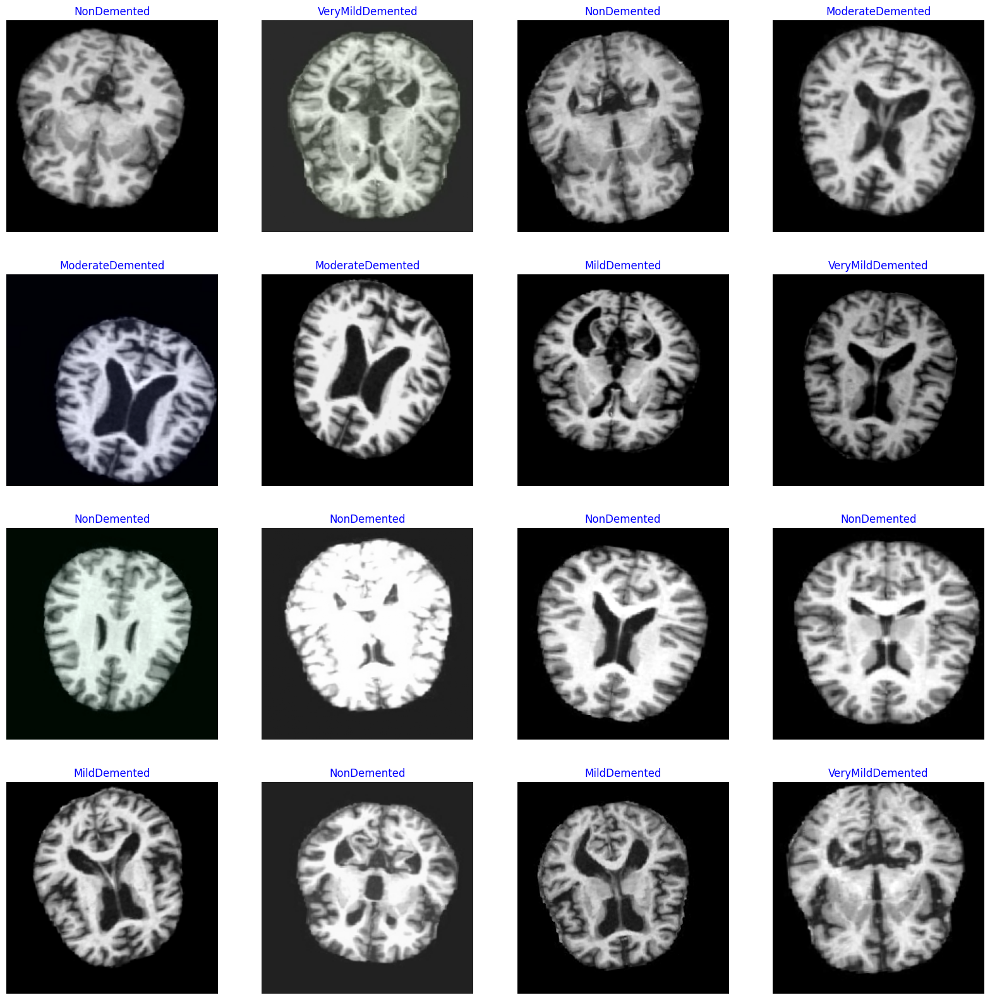

In [24]:
gen_dict = train_generator.class_indices
classes = list(gen_dict.keys())
images, labels = next(train_generator)

plt.figure(figsize= (20,20))
for i in range(16):
    plt.subplot(4,4,i+1)
    image = images[i] / 255
    plt.imshow(image)
    index = np.argmax(labels[i])
    class_name = classes[index]
    plt.title(class_name , color = 'blue' , fontsize= 12)
    plt.axis('off')
plt.show()

# Denset121 Model

In [25]:
img_shape = (img_size[0], img_size[1], 3)
num_class = len(classes)

base_model = tf.keras.applications.DenseNet121(
    include_top=False,
    weights="imagenet",
    input_shape= img_shape,
    pooling='max',
)

densenet_model = Sequential([
    base_model,
    BatchNormalization(),
    Dense(256, activation='relu'), 
    Dropout(0.5),  
    Dense(num_class, activation='softmax')
])

densenet_model.compile(optimizer=Adamax(learning_rate=0.0005),
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

densenet_model.summary()

I0000 00:00:1759226708.786776     623 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1759226708.787462     623 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ densenet121 (Functional)        │ (None, 1024)           │     7,037,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       262,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,305,028 (27.87 MB)

 Trainable params: 7,219,332 (27.54 MB)

 Non-trainable params: 85,696 (334.75 KB)

In [26]:
epochs = 12
densenet_history = densenet_model.fit(x= train_generator, epochs = epochs, verbose = 1 , validation_data = val_generator ,
                   validation_steps = None , shuffle = False)

Epoch 1/12


I0000 00:00:1759226795.640579     681 service.cc:148] XLA service 0x7fbff8135f20 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1759226795.640623     681 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1759226795.640630     681 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1759226802.655105     681 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1759226880.352749     681 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1541/1541 ━━━━━━━━━━━━━━━━━━━━ 594s 276ms/step - accuracy: 0.5798 - loss: 1.0296 - val_accuracy: 0.7011 - val_loss: 0.6695
Epoch 2/12
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 359s 233ms/step - accuracy: 0.7923 - loss: 0.5019 - val_accuracy: 0.8911 - val_loss: 0.2584
Epoch 3/12
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 343s 222ms/step - accuracy: 0.8938 - loss: 0.2753 - val_accuracy: 0.8900 - val_loss: 0.2810
Epoch 4/12
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 342s 222ms/step - accuracy: 0.9401 - loss: 0.1643 - val_accuracy: 0.8915 - val_loss: 0.2722
Epoch 5/12
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 341s 221ms/step - accuracy: 0.9568 - loss: 0.1209 - val_accuracy: 0.9663 - val_loss: 0.0961
Epoch 6/12
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 334s 217ms/step - accuracy: 0.9690 - loss: 0.0910 - val_accuracy: 0.9642 - val_loss: 0.0982
Epoch 7/12
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 341s 221ms/step - accuracy: 0.9777 - loss: 0.0654 - val_accuracy: 0.9852 - val_loss: 0.0383
Epoch 8/12
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 334s 217ms/step - accuracy: 0.9

In [27]:
train_acc = densenet_history.history['accuracy']
train_loss = densenet_history.history['loss']
val_acc = densenet_history.history['val_accuracy']
val_loss = densenet_history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
val_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(train_acc))]
loss_label = f'Best epochs = {str(index_loss +1)}'
acc_label = f'Best epochs = {str(index_acc + 1)}'

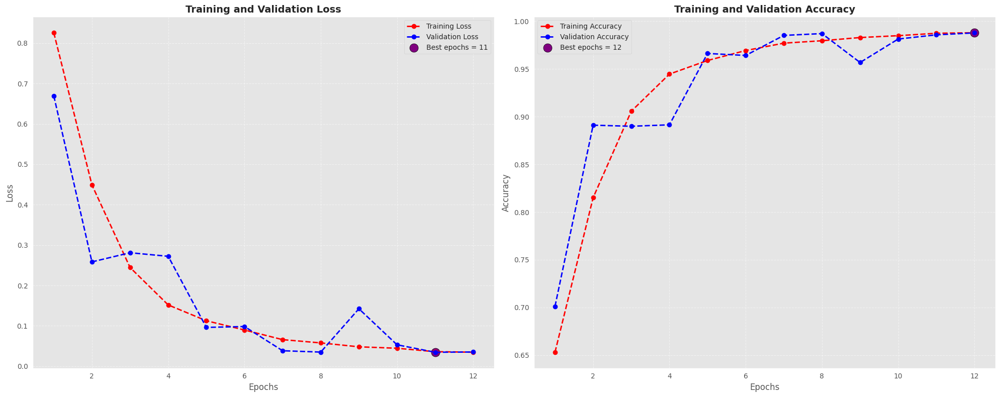

In [28]:
plt.figure(figsize=(20, 8))
plt.style.use("ggplot")

#Loss plot
plt.subplot(1, 2, 1)
plt.plot(Epochs, train_loss, 'r--', linewidth=2, marker='o', label='Training Loss')
plt.plot(Epochs, val_loss, 'b--', linewidth=2, marker='o', label='Validation Loss')
plt.scatter(index_loss + 1, val_lowest, s=150, c='purple', edgecolors='black', label=loss_label)
plt.title('Training and Validation Loss', fontsize=14, fontweight='bold')
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

#Accuracy Plot
plt.subplot(1, 2, 2)
plt.plot(Epochs, train_acc, 'r--', linewidth=2, marker='o', label='Training Accuracy')
plt.plot(Epochs, val_acc, 'b--', linewidth=2, marker='o', label='Validation Accuracy')
plt.scatter(index_acc + 1, val_highest, s=150, c='purple', edgecolors='black', label=acc_label)
plt.title('Training and Validation Accuracy', fontsize=14, fontweight='bold')
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout() 
plt.show()


In [29]:
train_score = densenet_model.evaluate(train_generator , steps =16 , verbose = 1)
valid_score = densenet_model.evaluate(val_generator , steps = 16 , verbose = 1)
test_score = densenet_model.evaluate(test_generator , steps = 16 , verbose = 1)
print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.9784 - loss: 0.0442
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - accuracy: 0.9990 - loss: 0.0099
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - accuracy: 0.9987 - loss: 0.0132
Train Loss:  0.016835922375321388
Train Accuracy:  0.9921875
--------------------
Validation Loss:  0.013552122749388218
Validation Accuracy:  0.99609375
--------------------
Test Loss:  0.023589760065078735
Test Accuracy:  0.99609375


331/331 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step


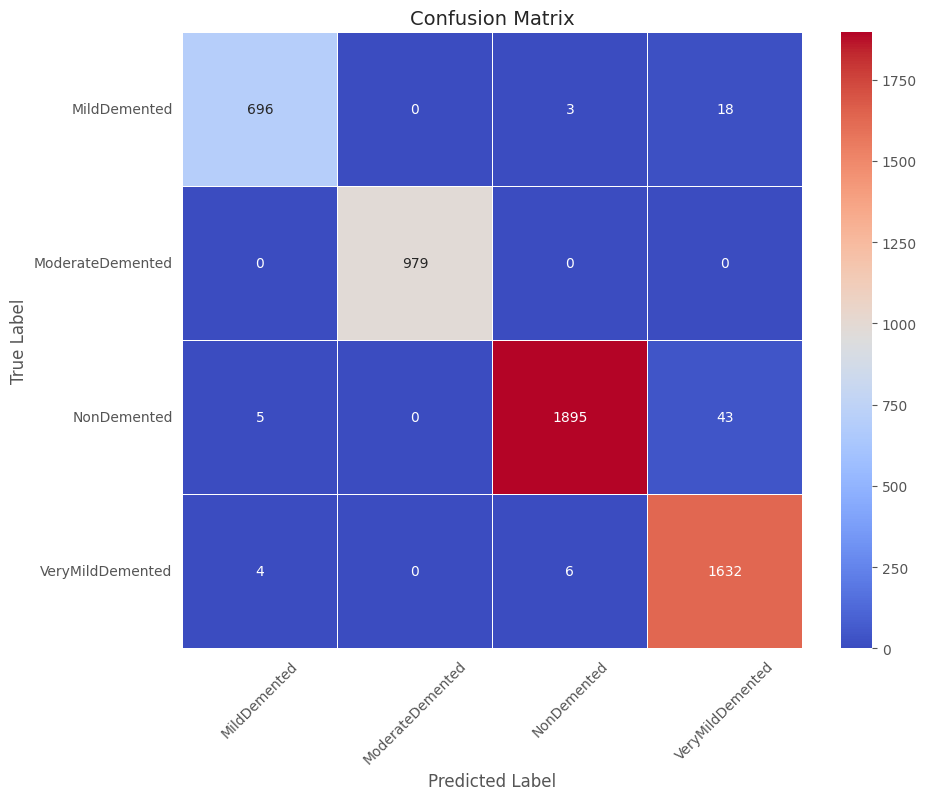

In [30]:
preds = densenet_model.predict(test_generator)  
y_pred = np.argmax(preds, axis=1)
# Get class labels
g_dict = test_generator.class_indices
classes = list(g_dict.keys())

# Compute Confusion Matrix
cm = confusion_matrix(test_generator.classes, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap="coolwarm", xticklabels=classes, yticklabels=classes, linewidths=0.5)
plt.title("Confusion Matrix", fontsize=14)
plt.xlabel("Predicted Label", fontsize=12)
plt.ylabel("True Label", fontsize=12)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

In [31]:
print(classification_report(test_generator.classes, y_pred, target_names= classes))

                  precision    recall  f1-score   support

    MildDemented       0.99      0.97      0.98       717
ModerateDemented       1.00      1.00      1.00       979
     NonDemented       1.00      0.98      0.99      1943
VeryMildDemented       0.96      0.99      0.98      1642

        accuracy                           0.99      5281
       macro avg       0.99      0.98      0.99      5281
    weighted avg       0.99      0.99      0.99      5281



# EfficientB0 Model

In [32]:
img_shape = (img_size[0], img_size[1], 3)
num_class = len(classes)

base_model = tf.keras.applications.EfficientNetB0(
    include_top=False,
    weights="imagenet",
    input_shape=img_shape,
    pooling='avg'
)

efficient_model = Sequential([
    base_model,
    BatchNormalization(),
    Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
    Dropout(0.5),
    Dense(num_class, activation='softmax')
])

efficient_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

efficient_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 1280)           │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,383,655 (16.72 MB)

 Trainable params: 4,339,072 (16.55 MB)

 Non-trainable params: 44,583 (174.16 KB)

In [33]:
epochs = 20
efficient_history = efficient_model.fit(x= train_generator, epochs = epochs, verbose = 1 , validation_data = val_generator ,
                   validation_steps = None ,shuffle = False)

Epoch 1/20


E0000 00:00:1759231154.137016     680 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1759231154.276406     680 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1759231154.624414     680 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1759231154.764833     680 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


1541/1541 ━━━━━━━━━━━━━━━━━━━━ 445s 231ms/step - accuracy: 0.4996 - loss: 1.7125 - val_accuracy: 0.7292 - val_loss: 1.0078
Epoch 2/20
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 326s 211ms/step - accuracy: 0.7178 - loss: 1.0398 - val_accuracy: 0.8375 - val_loss: 0.7556
Epoch 3/20
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 322s 209ms/step - accuracy: 0.8314 - loss: 0.7829 - val_accuracy: 0.8873 - val_loss: 0.6177
Epoch 4/20
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 323s 209ms/step - accuracy: 0.9063 - loss: 0.5653 - val_accuracy: 0.9638 - val_loss: 0.4035
Epoch 5/20
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 319s 207ms/step - accuracy: 0.9436 - loss: 0.4428 - val_accuracy: 0.9799 - val_loss: 0.3170
Epoch 6/20
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 323s 210ms/step - accuracy: 0.9588 - loss: 0.3549 - val_accuracy: 0.9871 - val_loss: 0.2498
Epoch 7/20
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 322s 209ms/step - accuracy: 0.9725 - loss: 0.2844 - val_accuracy: 0.9913 - val_loss: 0.2044
Epoch 8/20
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 320s 208ms/step - accuracy: 0.9

In [34]:
train_acc = efficient_history.history['accuracy']
train_loss = efficient_history.history['loss']
val_acc = efficient_history.history['val_accuracy']
val_loss = efficient_history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
val_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(train_acc))]
loss_label = f'Best epochs = {str(index_loss +1)}'
acc_label = f'Best epochs = {str(index_acc + 1)}'

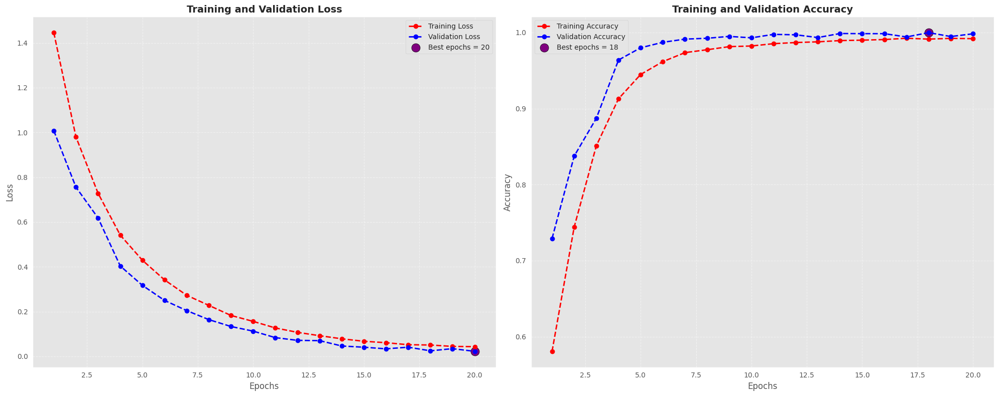

In [35]:
plt.figure(figsize=(20, 8))
plt.style.use("ggplot")

#Loss plot
plt.subplot(1, 2, 1)
plt.plot(Epochs, train_loss, 'r--', linewidth=2, marker='o', label='Training Loss')
plt.plot(Epochs, val_loss, 'b--', linewidth=2, marker='o', label='Validation Loss')
plt.scatter(index_loss + 1, val_lowest, s=150, c='purple', edgecolors='black', label=loss_label)
plt.title('Training and Validation Loss', fontsize=14, fontweight='bold')
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

#Accuracy Plot
plt.subplot(1, 2, 2)
plt.plot(Epochs, train_acc, 'r--', linewidth=2, marker='o', label='Training Accuracy')
plt.plot(Epochs, val_acc, 'b--', linewidth=2, marker='o', label='Validation Accuracy')
plt.scatter(index_acc + 1, val_highest, s=150, c='purple', edgecolors='black', label=acc_label)
plt.title('Training and Validation Accuracy', fontsize=14, fontweight='bold')
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout() 
plt.show()


In [36]:
train_score = efficient_model.evaluate(train_generator , steps =16 , verbose = 1)
valid_score = efficient_model.evaluate(val_generator , steps = 16 , verbose = 1)
test_score = efficient_model.evaluate(test_generator , steps = 16 , verbose = 1)
print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 192ms/step - accuracy: 1.0000 - loss: 0.0198
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9984 - loss: 0.0231
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - accuracy: 1.0000 - loss: 0.0212
Train Loss:  0.01925351470708847
Train Accuracy:  1.0
--------------------
Validation Loss:  0.0295871589332819
Validation Accuracy:  0.99609375
--------------------
Test Loss:  0.019973373040556908
Test Accuracy:  1.0


331/331 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step


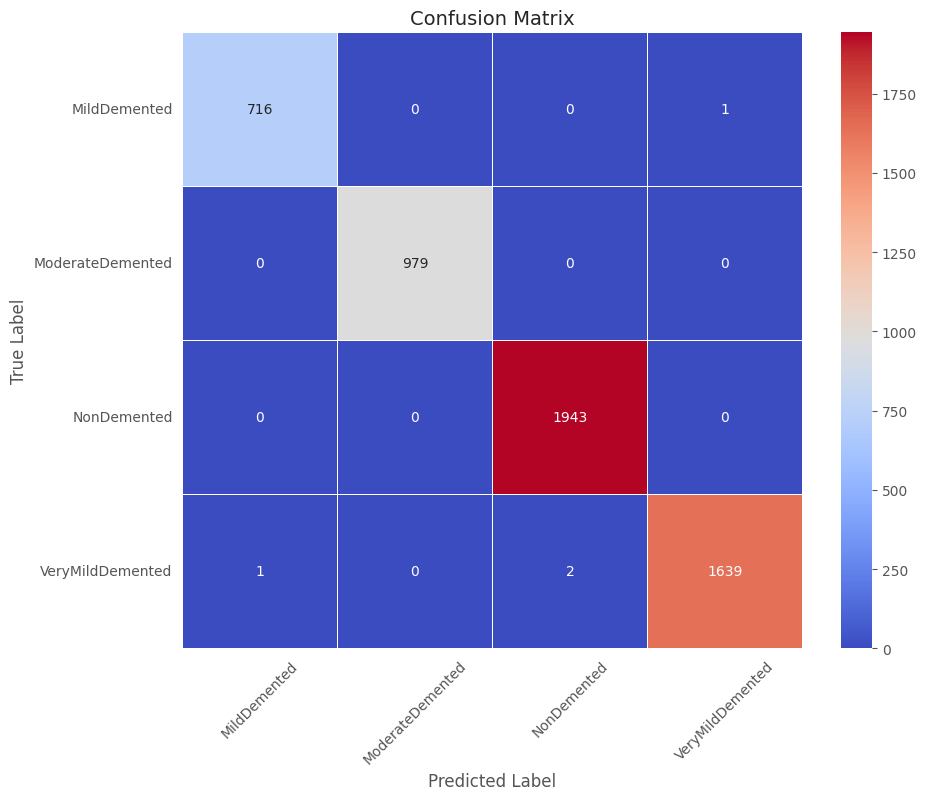

In [37]:
preds = efficient_model.predict(test_generator)  
y_pred = np.argmax(preds, axis=1)
# Get class labels
g_dict = test_generator.class_indices
classes = list(g_dict.keys())

# Compute Confusion Matrix
cm = confusion_matrix(test_generator.classes, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap="coolwarm", xticklabels=classes, yticklabels=classes, linewidths=0.5)
plt.title("Confusion Matrix", fontsize=14)
plt.xlabel("Predicted Label", fontsize=12)
plt.ylabel("True Label", fontsize=12)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

In [38]:
print(classification_report(test_generator.classes, y_pred, target_names= classes))

                  precision    recall  f1-score   support

    MildDemented       1.00      1.00      1.00       717
ModerateDemented       1.00      1.00      1.00       979
     NonDemented       1.00      1.00      1.00      1943
VeryMildDemented       1.00      1.00      1.00      1642

        accuracy                           1.00      5281
       macro avg       1.00      1.00      1.00      5281
    weighted avg       1.00      1.00      1.00      5281



# Resnet50 Model

In [39]:
img_shape = (img_size[0], img_size[1], 3)
num_class = len(classes)


base_model = tf.keras.applications.ResNet50(
    include_top=False,
    weights="imagenet",
    input_shape=img_shape,
    pooling='max',
)

for layer in base_model.layers:
    layer.trainable = False

resnet_model = Sequential([
    base_model,
    BatchNormalization(),
    Dense(256, activation='relu'),
    Dropout(0.4),
    Dense(num_class, activation='softmax')
])

resnet_model.compile(optimizer= Adam(learning_rate= 0.0001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

resnet_model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 2048)           │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,121,476 (92.02 MB)

 Trainable params: 529,668 (2.02 MB)

 Non-trainable params: 23,591,808 (90.00 MB)

In [40]:
epochs = 20
resnet_history = resnet_model.fit(x= train_generator, epochs = epochs, verbose = 1 , validation_data = val_generator ,
                   validation_steps = None ,shuffle = False)

Epoch 1/20
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 349s 216ms/step - accuracy: 0.4871 - loss: 1.3294 - val_accuracy: 0.6856 - val_loss: 0.6930
Epoch 2/20
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 324s 210ms/step - accuracy: 0.6372 - loss: 0.8545 - val_accuracy: 0.7225 - val_loss: 0.6049
Epoch 3/20
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 326s 212ms/step - accuracy: 0.6740 - loss: 0.7388 - val_accuracy: 0.7473 - val_loss: 0.5570
Epoch 4/20
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 322s 209ms/step - accuracy: 0.7074 - loss: 0.6713 - val_accuracy: 0.7527 - val_loss: 0.5430
Epoch 5/20
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 321s 208ms/step - accuracy: 0.7266 - loss: 0.6341 - val_accuracy: 0.7741 - val_loss: 0.5139
Epoch 6/20
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 323s 209ms/step - accuracy: 0.7394 - loss: 0.5937 - val_accuracy: 0.7856 - val_loss: 0.4861
Epoch 7/20
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 328s 213ms/step - accuracy: 0.7432 - loss: 0.5805 - val_accuracy: 0.7966 - val_loss: 0.4726
Epoch 8/20
1541/1541 ━━━━━━━━━━━━━━━━━━━━ 325s 211ms/step - ac

In [41]:
train_acc = resnet_history.history['accuracy']
train_loss = resnet_history.history['loss']
val_acc = resnet_history.history['val_accuracy']
val_loss = resnet_history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
val_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(train_acc))]
loss_label = f'Best epochs = {str(index_loss +1)}'
acc_label = f'Best epochs = {str(index_acc + 1)}'

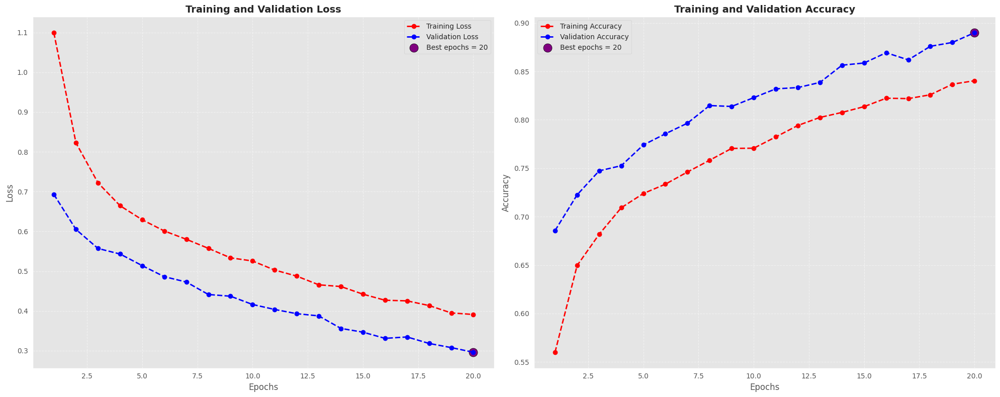

In [42]:
plt.figure(figsize=(20, 8))
plt.style.use("ggplot")

#Loss plot
plt.subplot(1, 2, 1)
plt.plot(Epochs, train_loss, 'r--', linewidth=2, marker='o', label='Training Loss')
plt.plot(Epochs, val_loss, 'b--', linewidth=2, marker='o', label='Validation Loss')
plt.scatter(index_loss + 1, val_lowest, s=150, c='purple', edgecolors='black', label=loss_label)
plt.title('Training and Validation Loss', fontsize=14, fontweight='bold')
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)

#Accuracy Plot
plt.subplot(1, 2, 2)
plt.plot(Epochs, train_acc, 'r--', linewidth=2, marker='o', label='Training Accuracy')
plt.plot(Epochs, val_acc, 'b--', linewidth=2, marker='o', label='Validation Accuracy')
plt.scatter(index_acc + 1, val_highest, s=150, c='purple', edgecolors='black', label=acc_label)
plt.title('Training and Validation Accuracy', fontsize=14, fontweight='bold')
plt.xlabel('Epochs', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout() 
plt.show()


In [43]:
train_score = resnet_model.evaluate(train_generator , steps =16 , verbose = 1)
valid_score = resnet_model.evaluate(val_generator , steps = 16 , verbose = 1)
test_score = resnet_model.evaluate(test_generator , steps = 16 , verbose = 1)
print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.9068 - loss: 0.2541
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.8978 - loss: 0.2542
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.9031 - loss: 0.2737
Train Loss:  0.24844498932361603
Train Accuracy:  0.9140625
--------------------
Validation Loss:  0.26009440422058105
Validation Accuracy:  0.88671875
--------------------
Test Loss:  0.2496238350868225
Test Accuracy:  0.90625


331/331 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step


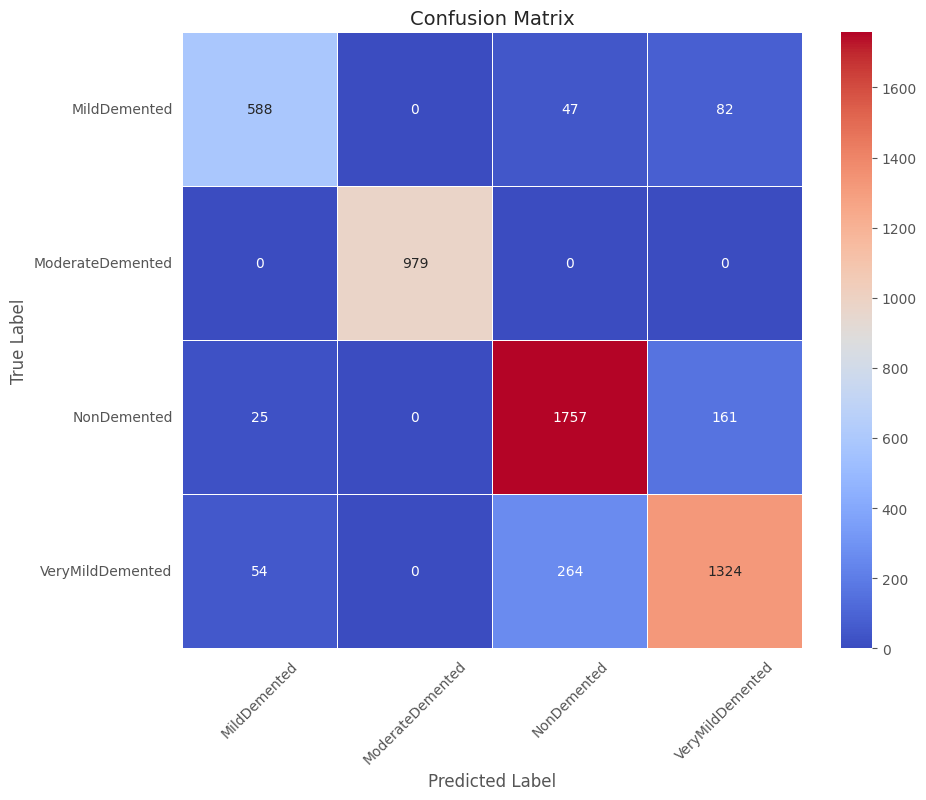

In [44]:
preds = resnet_model.predict(test_generator)  
y_pred = np.argmax(preds, axis=1)
# Get class labels
g_dict = test_generator.class_indices
classes = list(g_dict.keys())

# Compute Confusion Matrix
cm = confusion_matrix(test_generator.classes, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap="coolwarm", xticklabels=classes, yticklabels=classes, linewidths=0.5)
plt.title("Confusion Matrix", fontsize=14)
plt.xlabel("Predicted Label", fontsize=12)
plt.ylabel("True Label", fontsize=12)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

In [45]:
print(classification_report(test_generator.classes, y_pred, target_names= classes))

                  precision    recall  f1-score   support

    MildDemented       0.88      0.82      0.85       717
ModerateDemented       1.00      1.00      1.00       979
     NonDemented       0.85      0.90      0.88      1943
VeryMildDemented       0.84      0.81      0.83      1642

        accuracy                           0.88      5281
       macro avg       0.89      0.88      0.89      5281
    weighted avg       0.88      0.88      0.88      5281



# Prediction

In [47]:
#from tensorflow.keras.preprocessing.image import load_img, img_to_array
import random

331/331 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step


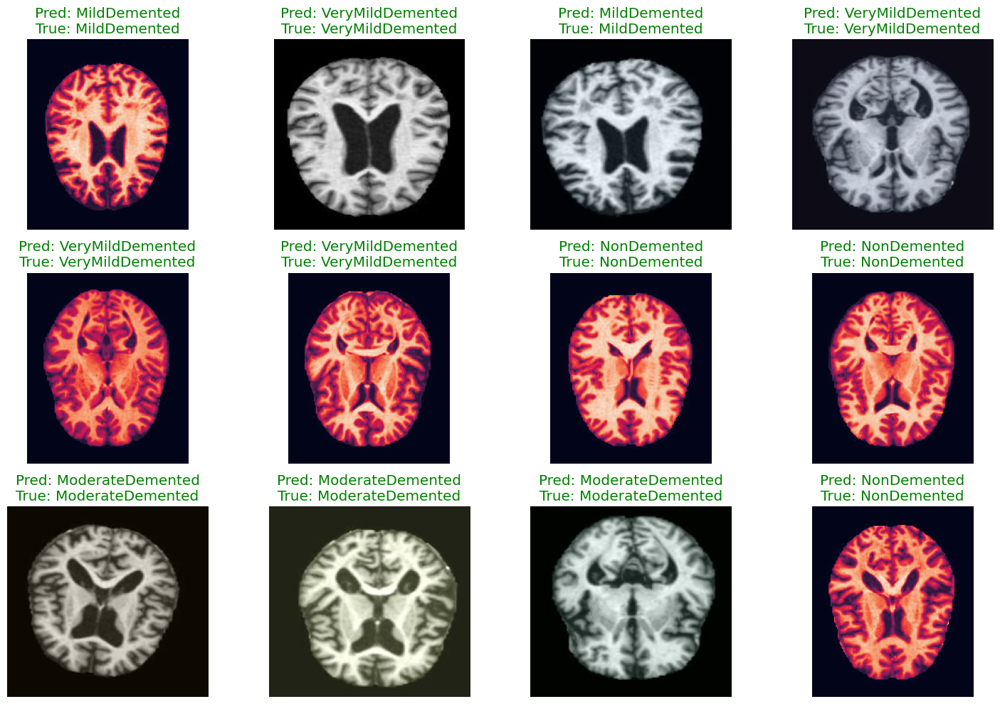

In [49]:
image_paths = test_generator.filepaths
true_indices = test_generator.classes
class_labels = list(train_generator.class_indices.keys())

preds = efficient_model.predict(test_generator, steps = len(test_generator), verbose = 1)
predicted_indices = preds.argmax(axis=1)

idx_to_class = {v: k for k, v in train_generator.class_indices.items()}
predicted_labels = [idx_to_class[i] for i in predicted_indices]
true_labels = [idx_to_class[i] for i in true_indices]

n = 12
indices = random.sample(range(len(image_paths)), n)

plt.figure(figsize=(15, 10))
for i, idx in enumerate(indices):
    plt.subplot(3, 4, i+1)
    img = plt.imread(image_paths[idx])
    plt.imshow(img)
    
    # Green if correct, red if wrong
    color = "green" if predicted_labels[idx] == true_labels[idx] else "red"
    plt.title(f"Pred: {predicted_labels[idx]}\nTrue: {true_labels[idx]}", color=color)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [50]:
efficient_model.save('efficient_model_alzheimers.h5') 